<a href="https://colab.research.google.com/github/yegor-vynokurov/computer-vision-classification/blob/main/classification_v4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sports Image Classification

### load and install

In [ ]:
# pip install pyod -q

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# pip install torchsampler

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install segmentation_models_pytorch -q

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import os
import sys
from PIL import Image
import shutil
from pathlib import Path, PurePath

from tqdm import tqdm

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import datasets
from torchvision import transforms
# from torchsampler import ImbalancedDatasetSampler
from torch.utils.data import Subset

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.models as models

import segmentation_models_pytorch as smp

# from pyod.models.lof import LOF

# from sklearn.preprocessing import QuantileTransformer
# from tensorflow.keras.preprocessing.image import ImageDataGenerator

### Functions

In [ ]:
def set_seed(seed):
    '''
    set random seed in different ways
    '''
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

set_seed(42)

def train_one_epoch(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    optimizer: optim.Optimizer,
    device: str = "cpu",
    verbose: bool = True,
) -> dict:


        model.train()

        losses = []
        accuracies = []

        with tqdm(total=len(loader), desc="training", file=sys.stdout, ncols=100, disable=not verbose) as progress:
            for x_batch, y_true in loader:
                x_batch = x_batch.to(device)
#                 y_true = y_true.squeeze(1).to(device)
                y_true = y_true.to(device)

                optimizer.zero_grad()

                y_pred = model(x_batch)

                loss = criterion(y_pred, y_true)

                loss.backward()

                losses.append(loss.item())
                accuracies.append((y_pred.argmax(1) == y_true).float().detach().cpu().numpy())

                progress.set_postfix_str(f"loss {losses[-1]:.4f}")

                optimizer.step()

                progress.update(1)

        logs = {
            "losses": np.array(losses),
            "accuracies": np.concatenate(accuracies)
        }

        return logs


@torch.inference_mode()
def evaluate(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    device: str = "cpu",
    verbose: bool = True,
) -> dict:


    model.eval()

    losses = []
    accuracies = []

    for x_batch, y_true in tqdm(loader, desc="evaluation", file=sys.stdout, ncols=100, disable=not verbose):
        x_batch = x_batch.to(device)
#         y_true = y_true.squeeze(1).to(device)
        y_true = y_true.to(device)

        y_pred = model(x_batch)

        loss = criterion(y_pred, y_true)

        losses.append(loss.item())
        accuracies.append((y_pred.argmax(1) == y_true).float().detach().cpu().numpy())

    logs = {
        "losses": np.array(losses),
        "accuracies": np.concatenate(accuracies)
    }
    return logs

@torch.inference_mode()
def test(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    device: str = "cpu",
    verbose: bool = True,
) -> dict:


    model.eval()

    losses = []
    accuracies = []

    for x_batch, y_true in loader:
        x_batch = x_batch.to(device)
#         y_true = y_true.squeeze(1).to(device)
        y_true = y_true.to(device)

        y_pred = model(x_batch)

        loss = criterion(y_pred, y_true)

        losses.append(loss.item())
        accuracies.append((y_pred.argmax(1) == y_true).float().detach().cpu().numpy())

    logs = {
        "losses": np.array(losses),
        "accuracies": np.concatenate(accuracies)
    }
    return logs

def denorm(img):
    '''
    denormalization of image after normalization
    '''
    return img * config.IMAGENET_MEAN[0] + config.IMAGENET_STD[0]

def plot_preds(test_set, test_sample_dataloader):
    '''
    plot the result of prediction
    '''
    fig = plt.figure(figsize=(20,16))
    axis = 1
    with torch.no_grad():
        for i, (x_batch, y_true) in enumerate(test_sample_dataloader):
            x = x_batch.to(config.DEVICE)
            y_true = y_true.to(config.DEVICE)

            y = model(x)
            pred = torch.argmax(y)
            ax = fig.add_subplot(4,4, axis)
            ax.set_xticks([])
            ax.set_yticks([])
#             img,_=test_set[i]
            plt.imshow(denorm(x_batch).squeeze().permute(1,2,0))
            axis += 1
            ax.set_title("label: {} \n pred: {} ".format(test_data.classes[y_true],
                                                         test_data.classes[pred]))

# Analyse and visualize data

### Load data

In [ ]:
dataset = {
             "train_data" : "/kaggle/input/train",
             "valid_data" : "/kaggle/input/valid",
             "test_data" : "/kaggle/input/test"
          }

all_data = []
for path in dataset.values():
    data = {"imgpath": [] , "labels": [] }
    category = os.listdir(path)

    for folder in category:
        folderpath = os.path.join(path , folder)
        filelist = os.listdir(folderpath)
        for file in filelist:
            fpath = os.path.join(folderpath, file)
            data["imgpath"].append(fpath)
            data["labels"].append(folder)


    all_data.append(data.copy())
    data.clear()



train_df = pd.DataFrame(all_data[0] , index=range(len(all_data[0]['imgpath'])))
valid_df = pd.DataFrame(all_data[1] , index=range(len(all_data[1]['imgpath'])))
test_df = pd.DataFrame(all_data[2] , index=range(len(all_data[2]['imgpath'])))

In [ ]:
train_df.reset_index()

,index,imgpath,labels
0,0,/kaggle/input/sports-classification/train/bobs...,bobsled
1,1,/kaggle/input/sports-classification/train/bobs...,bobsled
2,2,/kaggle/input/sports-classification/train/bobs...,bobsled
3,3,/kaggle/input/sports-classification/train/bobs...,bobsled
4,4,/kaggle/input/sports-classification/train/bobs...,bobsled
...,...,...,...
13488,13488,/kaggle/input/sports-classification/train/roll...,roller derby
13489,13489,/kaggle/input/sports-classification/train/roll...,roller derby
13490,13490,/kaggle/input/sports-classification/train/roll...,roller derby
13491,13491,/kaggle/input/sports-classification/train/roll...,roller derby


### visualizing of classes

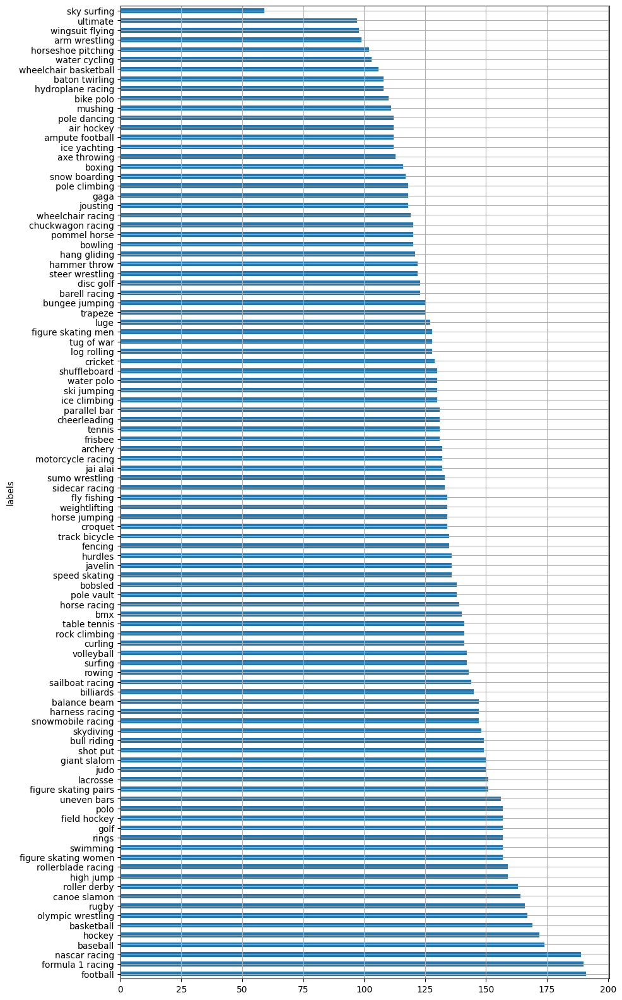

In [ ]:
train_df['labels'].value_counts().plot(kind = 'barh', figsize = (10,20), grid = True);

Датасет незбалансований, будемо балансувати.

### Visualizing of images

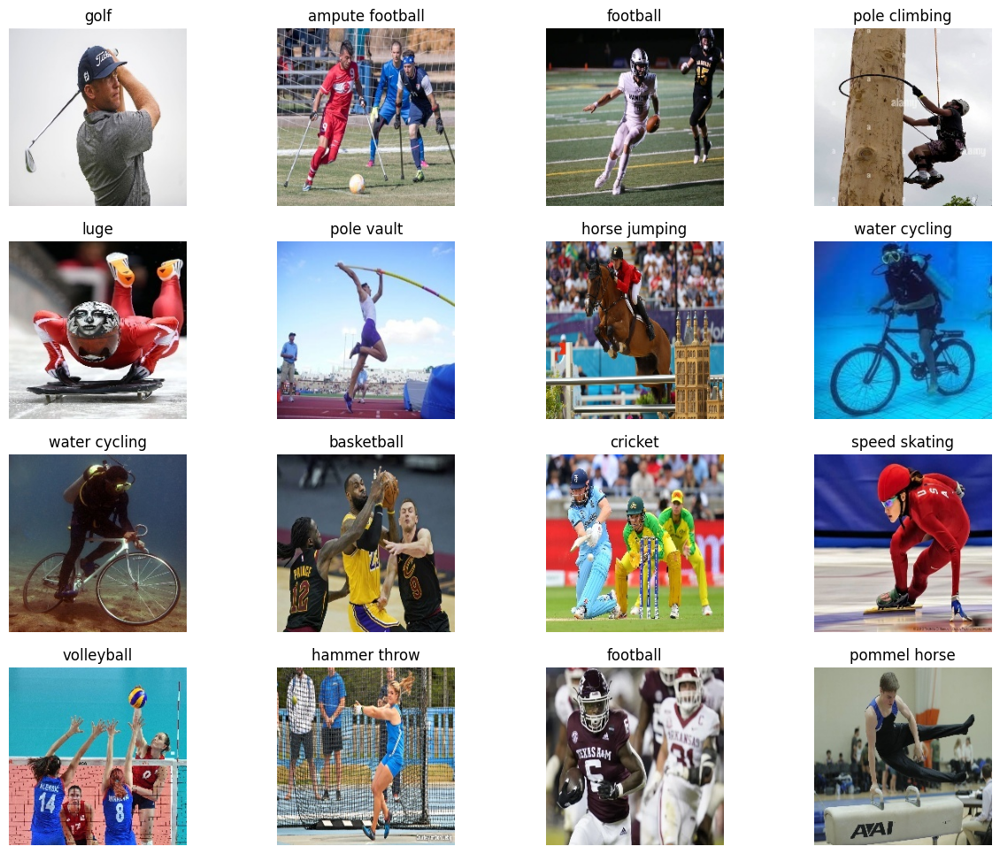

In [ ]:
plt.figure(figsize=(15,12))
for i, row in valid_df.sample(n=16).reset_index().iterrows():
    plt.subplot(4,4,i+1)
    image_path = row['imgpath']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(row["labels"])
    plt.axis('off')
plt.show()

Сохраняем словарь с выбросами:

In [ ]:
import pickle
def save_obj(obj, path, name):
    with open(f'{path}'+ name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(path, name):
    with open(f'{path}' + name + '.pkl', 'rb') as f:
        return pickle.load(f)

In [ ]:
# save_obj(indexes, '/kaggle/working/', 'indexes')
# outliers = load_obj('/kaggle/working/', 'dct')

# balancing of classes

Dataset is imbalanced. Try to balancing it and show results.

For it use ImbalancedDatasetSampler in DataLoader for train data

In [ ]:
class config:
    # specify the paths to datasets
    DOWNLOAD_DIR = Path('../input/sports-classification')
#     DOWNLOAD_DIR = Path('../input')
    TRAIN_DIR = DOWNLOAD_DIR.joinpath('train')
#     ADD_DIR = '/kaggle/working/aug'
    VAL_DIR = DOWNLOAD_DIR.joinpath('valid')
    TEST_DIR = DOWNLOAD_DIR.joinpath('test')

    # set the input height and width
    INPUT_HEIGHT = 64 # 224
    INPUT_WIDTH = 64 # 224

    # set the input heig/ht and width
    IMAGENET_MEAN = [0.485, 0.456, 0.406]
    IMAGENET_STD = [0.229, 0.224, 0.225]

    IMAGE_TYPE = '.jpg'
    BATCH_SIZE = 64
    MODEL_NAME = 'vit_base'
    DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
    TRAINING_PARAMS = 'training_hyperparams/imagenet_vit_train_params'

    NUM_CLASSES = 100
    CHECKPOINT_DIR = 'checkpoints'

In [ ]:
# initialize our data augmentation functions
resize = transforms.Resize(size=(config.INPUT_HEIGHT,config.INPUT_WIDTH))
make_tensor = transforms.ToTensor()
normalize = transforms.Normalize(mean=config.IMAGENET_MEAN, std=config.IMAGENET_STD)
center_cropper = transforms.CenterCrop((config.INPUT_HEIGHT,config.INPUT_WIDTH))
random_horizontal_flip = transforms.RandomHorizontalFlip(p=0.75)
random_vertical_flip = transforms.RandomVerticalFlip(p=0.75)
random_rotation = transforms.RandomRotation(degrees=90)
random_crop = transforms.RandomCrop(size=(200,200))
augmix = transforms.AugMix(severity = 3, mixture_width=3, alpha=0.2)
auto_augment = transforms.AutoAugment()
random_augment = transforms.RandAugment()


train_transforms = transforms.Compose([
  resize,
  auto_augment,
  random_augment,
  make_tensor,
  normalize
])

val_transforms = transforms.Compose([resize, make_tensor, normalize])
# make_tensor = transforms.ToTensor()

In [ ]:
def create_dataloaders(
    train_dir: str,
#     add_dir: str,
    val_dir: str,
    test_dir: str,
    train_transform: transforms.Compose,
    val_transform:  transforms.Compose,
    test_transform:  transforms.Compose,
    batch_size: int,
    num_workers: int=2,
#     indexes_to_include: list = indexes
):
  """Creates training and validation DataLoaders.
  Args:
    train_dir: Path to training data.
    val_dir: Path to validation data.
    transform: Transformation pipeline.
    batch_size: Number of samples per batch in each of the DataLoaders.
    num_workers: An integer for number of workers per DataLoader.
  Returns:
    A tuple of (train_dataloader, val_dataloader, class_names).
  """
  # Use ImageFolder to create dataset
#   l = []
#   train_data1 = datasets.ImageFolder(train_dir, transform=train_transform)
#   l.append(train_data1)
#   train_data2 = datasets.ImageFolder(add_dir, transform=train_transform)
#   l.append(train_data2)
#   image_datasets = torch.utils.data.ConcatDataset(l)
  train_data = datasets.ImageFolder(train_dir, transform=train_transform)
  # Get class names
  class_names = train_data.classes
#   train_data = Subset(train_data,indexes_to_include)

  val_data = datasets.ImageFolder(val_dir, transform=val_transform)

  test_data = datasets.ImageFolder(test_dir, transform=val_transform)
    #   train_data = Subset(train_data,indexes_to_include)

  print(f"[INFO] training dataset contains {len(train_data)} samples...")
  print(f"[INFO] validation dataset contains {len(val_data)} samples...")
  print(f"[INFO] test dataset contains {len(test_data)} samples...")

  print(f"[INFO] dataset contains {len(class_names)} labels...")

  # Turn images into data loaders
  print("[INFO] creating training and validation set dataloaders...")
  train_dataloader = DataLoader(
      train_data,
      batch_size=batch_size,
      shuffle=False,
      drop_last=True,
      num_workers=num_workers,
      pin_memory=True,
      persistent_workers=True,
      sampler=ImbalancedDatasetSampler(train_data)
  )
  val_dataloader = DataLoader(
      val_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
      drop_last=False,
      persistent_workers=True
  )

  test_dataloader = DataLoader(
      test_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
      drop_last=False,
      persistent_workers=True
  )

  return train_dataloader, val_dataloader, test_dataloader, class_names

In [ ]:
train_dataloader, valid_dataloader, test_dataloader, class_names = create_dataloaders(
                                train_dir=config.TRAIN_DIR,
#                                 add_dir = config.ADD_DIR,
                                val_dir=config.VAL_DIR,
                                test_dir=config.TEST_DIR,
                                train_transform=train_transforms,
                                val_transform=val_transforms,
                                test_transform=val_transforms,
                                batch_size=config.BATCH_SIZE)

[INFO] training dataset contains 13492 samples...
[INFO] validation dataset contains 500 samples...
[INFO] test dataset contains 500 samples...
[INFO] dataset contains 100 labels...
[INFO] creating training and validation set dataloaders...


## Baseline model without pretrain

balanced dataset

In [ ]:
class TinyVGG(nn.Module):
    """
    Model architecture copying TinyVGG from:
    https://poloclub.github.io/cnn-explainer/
    """
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int) -> None:
        super().__init__()
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(in_channels=input_shape,
                      out_channels=hidden_units,
                      kernel_size=3, # how big is the square that's going over the image?
                      stride=1, # default
                      padding=1), # options = "valid" (no padding) or "same" (output has same shape as input) or int for specific number
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_units,
                      out_channels=hidden_units,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,
                         stride=2) # default stride value is same as kernel_size
        )
        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            # Where did this in_features shape come from?
            # It's because each layer of our network compresses and changes the shape of our inputs data.
            nn.Linear(in_features=hidden_units*16*16,
                      out_features=output_shape)
        )

    def forward(self, x: torch.Tensor):
        x = self.conv_block_1(x)
        # print(x.shape)
        x = self.conv_block_2(x)
        # print(x.shape)
        x = self.classifier(x)
        # print(x.shape)
        return x
        # return self.classifier(self.conv_block_2(self.conv_block_1(x))) # <- leverage the benefits of operator fusion


In [ ]:

model_0 = TinyVGG(input_shape=3, # number of color channels (3 for RGB)
                  hidden_units=10,
                  output_shape=config.NUM_CLASSES)

In [ ]:
model = model_0
model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")
optimizer = optim.Adam(model.parameters(), lr=1e-3)

loss_fn = nn.CrossEntropyLoss()

Number of trainable parameters - 259110
Device - cpu



In [ ]:
# 1. Get a batch of images and labels from the DataLoader
img_batch, label_batch = next(iter(train_dataloader))

# 2. Get a single image from the batch and unsqueeze the image so its shape fits the model
img_single, label_single = img_batch[0].unsqueeze(dim=0), label_batch[0]
print(f"Single image shape: {img_single.shape}\n")

# 3. Perform a forward pass on a single image
model_0.eval()
with torch.inference_mode():
    pred = model_0(img_single.to(config.DEVICE))

# 4. Print out what's happening and convert model logits -> pred probs -> pred label
print(f"Output logits:\n{pred}\n")
print(f"Output prediction probabilities:\n{torch.softmax(pred, dim=1)}\n")
print(f"Output prediction label:\n{torch.argmax(torch.softmax(pred, dim=1), dim=1)}\n")
print(f"Actual label:\n{label_single}")

Single image shape: torch.Size([1, 3, 64, 64])

Output logits:
tensor([[ 0.0993,  0.0815,  0.0399, -0.0552, -0.0458,  0.0717, -0.0678,  0.0869,
          0.0137,  0.0867, -0.0649, -0.0503,  0.0077, -0.0539,  0.0806,  0.0354,
          0.0066,  0.0615,  0.0305,  0.0598, -0.0619, -0.0263,  0.0914,  0.0352,
          0.0559,  0.1199,  0.0287,  0.0687,  0.0013, -0.0158,  0.0087,  0.0981,
          0.0476, -0.0952, -0.0293, -0.0110, -0.0278, -0.0405,  0.0371, -0.0006,
          0.0360, -0.0449,  0.0336,  0.0631, -0.0679, -0.0152,  0.0633,  0.0907,
          0.0400,  0.0488,  0.0311, -0.0684, -0.0400,  0.0500,  0.0021, -0.0395,
          0.0086,  0.0326,  0.0262,  0.0173, -0.0807, -0.0139, -0.0387, -0.0446,
         -0.0230,  0.1013, -0.0395,  0.0256, -0.0173,  0.0915,  0.0283, -0.0766,
         -0.0646,  0.0043,  0.1041,  0.0021,  0.0912, -0.0433,  0.0036, -0.0561,
          0.0114, -0.0293, -0.0222,  0.0769, -0.0714,  0.0239, -0.0008, -0.0301,
         -0.0278,  0.0237, -0.1458,  0.1496,  

In [ ]:
n_epochs = 50
# train_dataloader, valid_dataloader, test_dataloader, class_names
train_losses = []
train_accuracies = []

valid_losses = []
valid_accuracies = []

for ep in range(n_epochs):
    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_dataloader, loss_fn, optimizer, config.DEVICE, verbose=True)
    train_losses.append(np.mean(train_logs["losses"]))
    train_accuracies.append(np.mean(train_logs["accuracies"]))
    print("      loss:", train_losses[-1])
    print("  accuracy:", train_accuracies[-1])


    valid_logs = evaluate(model, valid_dataloader, loss_fn, config.DEVICE, verbose=True)
    valid_losses.append(np.mean(valid_logs["losses"]))
    valid_accuracies.append(np.mean(valid_logs["accuracies"]))
    print("      loss:", valid_losses[-1])
    print("  accuracy:", valid_accuracies[-1])

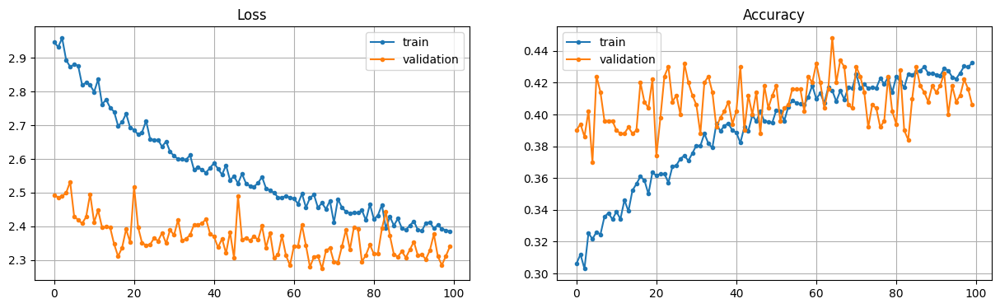

In [ ]:
fix, axes = plt.subplots(ncols=2, figsize=(15, 4))

axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
axes[0].plot(np.arange(len(valid_losses)), valid_losses, ".-")
axes[0].legend(["train", "validation"])
axes[0].set_title("Loss")
axes[0].grid()

axes[1].plot(np.arange(len(train_accuracies)), train_accuracies, ".-")
axes[1].plot(np.arange(len(valid_accuracies)), valid_accuracies, ".-")
axes[1].legend(["train", "validation"])
axes[1].set_title("Accuracy")
axes[1].grid();

In [ ]:

model_0 = TinyVGG(input_shape=3, # number of color channels (3 for RGB)
                  hidden_units=10,
                  output_shape=config.NUM_CLASSES)#.to(device))



In [ ]:
model = model_0
model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")
optimizer = optim.Adam(model.parameters(), lr=1e-3)#, weight_decay = 1e-4)

loss_fn = nn.CrossEntropyLoss()


scheduler2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.1, patience=3, verbose=True)
# lmbda = lambda epoch: 0.65 ** epoch
# scheduler1 = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)
scheduler1 = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10, 14, 16, 17, 18, 19], gamma=0.1)

Number of trainable parameters - 259110
Device - cpu



In [ ]:
n_epochs = 100
# train_dataloader, valid_dataloader, test_dataloader, class_names
train_losses = []
train_accuracies = []

valid_losses = []
valid_accuracies = []

for ep in range(n_epochs):

    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_dataloader, loss_fn, optimizer, config.DEVICE, verbose=True)
    train_losses.append(np.mean(train_logs["losses"]))
    train_accuracies.append(np.mean(train_logs["accuracies"]))
    print("      loss:", train_losses[-1])
    print("  accuracy:", train_accuracies[-1])


    valid_logs = evaluate(model, valid_dataloader, loss_fn, config.DEVICE, verbose=True)
    valid_losses.append(np.mean(valid_logs["losses"]))
    valid_accuracies.append(np.mean(valid_logs["accuracies"]))
    print("      loss:", valid_losses[-1])
    print("  accuracy:", valid_accuracies[-1])
    if ep <= 20:
        scheduler1.step(valid_losses[-1])
    else:
        scheduler2.step(valid_losses[-1])


Epoch  1/100
training: 100%|██████████████████████████████████████| 210/210 [00:27<00:00,  7.51it/s, loss 4.4511]
      loss: 4.549107288178943
  accuracy: 0.02157738
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.88it/s]

/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:152: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



      loss: 4.122682094573975
  accuracy: 0.084

Epoch  2/100
training: 100%|██████████████████████████████████████| 210/210 [00:26<00:00,  7.88it/s, loss 4.0580]
      loss: 4.198841753460112
  accuracy: 0.07842262
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11.62it/s]
      loss: 3.6383632719516754
  accuracy: 0.16

Epoch  3/100
training: 100%|██████████████████████████████████████| 210/210 [00:26<00:00,  7.84it/s, loss 3.8989]
      loss: 3.8808238256545295
  accuracy: 0.1327381
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12.20it/s]
      loss: 3.2500444650650024
  accuracy: 0.246

Epoch  4/100
training: 100%|██████████████████████████████████████| 210/210 [00:27<00:00,  7.64it/s, loss 3.3741]
      loss: 3.673134776524135
  accuracy: 0.17053571
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11.76it/s]
      loss: 3.047823876142502
  accuracy: 0.276

KeyboardInterrupt: 

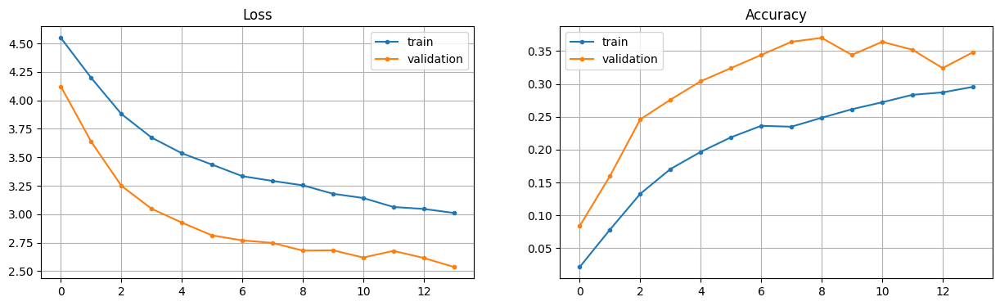

In [ ]:
fix, axes = plt.subplots(ncols=2, figsize=(15, 4))

axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
axes[0].plot(np.arange(len(valid_losses)), valid_losses, ".-")
axes[0].legend(["train", "validation"])
axes[0].set_title("Loss")
axes[0].grid()

axes[1].plot(np.arange(len(train_accuracies)), train_accuracies, ".-")
axes[1].plot(np.arange(len(valid_accuracies)), valid_accuracies, ".-")
axes[1].legend(["train", "validation"])
axes[1].set_title("Accuracy")
axes[1].grid();

# Pretraining models

and balanced dataset

best model ResNet50

Average accuracy on test dataset: 89.6 %

### resnet 18 immagenet1kv1

0.7 accuracy

In [ ]:

model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
model.fc = nn.Linear(model.fc.in_features, config.NUM_CLASSES)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 189MB/s] 


In [ ]:

model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")
optimizer = optim.Adam(model.parameters(), lr=1e-3)

loss_fn = nn.CrossEntropyLoss()

scheduler2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.1, patience=3, verbose=True)
lmbda = lambda epoch: 0.65 ** epoch
scheduler1 = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)

Number of trainable parameters - 11227812
Device - cuda



In [ ]:
n_epochs = 100
# train_dataloader, valid_dataloader, test_dataloader, class_names
train_losses = []
train_accuracies = []

valid_losses = []
valid_accuracies = []

best_score = float("inf")

for ep in range(n_epochs):

    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_dataloader, loss_fn, optimizer, config.DEVICE, verbose=True)
    train_losses.append(np.mean(train_logs["losses"]))
    train_accuracies.append(np.mean(train_logs["accuracies"]))
    print("      loss:", train_losses[-1])
    print("  accuracy:", train_accuracies[-1])


    valid_logs = evaluate(model, valid_dataloader, loss_fn, config.DEVICE, verbose=True)
    valid_losses.append(np.mean(valid_logs["losses"]))
    valid_accuracies.append(np.mean(valid_logs["accuracies"]))
    print("      loss:", valid_losses[-1])
    print("  accuracy:", valid_accuracies[-1])
    if ep <= 20:
        scheduler1.step(valid_losses[-1])
    else:
        scheduler2.step(valid_losses[-1])

    if valid_losses[-1].mean() <= best_score:
        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "epoch": ep,
            "num_epochs": n_epochs,
            "metrics": {
                "training": {"loss": train_losses[-1], "accuracy": train_accuracies[-1]},
                "validation": {"loss": valid_losses[-1], "accuracy": valid_accuracies[-1]},
            },
        }
        torch.save(checkpoint, "/kaggle/working/best18.pth")
        print("🟢 Saved new best state! 🟢")
        best_score = valid_losses[-1].mean()  # update best score to a new one


Epoch  1/100
training: 100%|██████████████████████████████████████| 210/210 [01:00<00:00,  3.46it/s, loss 3.1847]
      loss: 3.72076822803134
  accuracy: 0.15260416
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:02<00:00,  3.40it/s]
      loss: 2.8501846194267273
  accuracy: 0.294
🟢 Saved new best state! 🟢

Epoch  2/100


/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:152: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


training: 100%|██████████████████████████████████████| 210/210 [00:41<00:00,  5.07it/s, loss 2.1782]
      loss: 2.4394098968732925
  accuracy: 0.37953869
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12.15it/s]
      loss: 1.5718551725149155
  accuracy: 0.562
🟢 Saved new best state! 🟢

Epoch  3/100
training: 100%|██████████████████████████████████████| 210/210 [00:30<00:00,  6.82it/s, loss 1.4174]
      loss: 1.9727909360613143
  accuracy: 0.48563987
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 12.70it/s]
      loss: 1.3177093639969826
  accuracy: 0.61
🟢 Saved new best state! 🟢

Epoch  4/100
training: 100%|██████████████████████████████████████| 210/210 [00:27<00:00,  7.57it/s, loss 1.4827]
      loss: 1.7547119924000332
  accuracy: 0.537872
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11.46it/s]
      loss: 1.1767891645431519
  accuracy: 0.666
🟢 Saved 

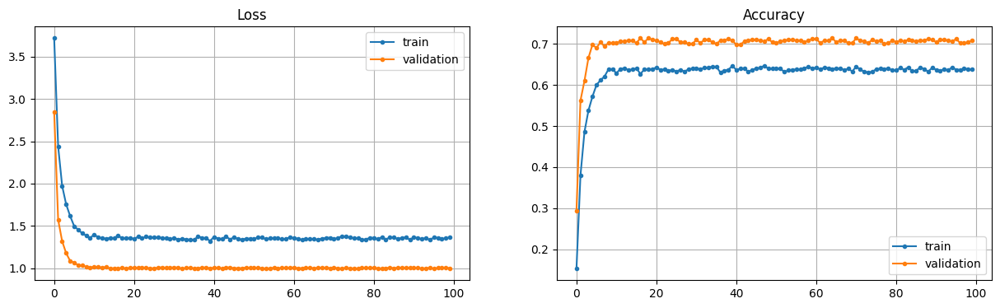

In [ ]:
fix, axes = plt.subplots(ncols=2, figsize=(15, 4))

axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
axes[0].plot(np.arange(len(valid_losses)), valid_losses, ".-")
axes[0].legend(["train", "validation"])
axes[0].set_title("Loss")
axes[0].grid()

axes[1].plot(np.arange(len(train_accuracies)), train_accuracies, ".-")
axes[1].plot(np.arange(len(valid_accuracies)), valid_accuracies, ".-")
axes[1].legend(["train", "validation"])
axes[1].set_title("Accuracy")
axes[1].grid();

### resnet 50 immagenet1kv2

0.87 best accuracy

In [ ]:
train_dataloader, valid_dataloader, test_dataloader, class_names = create_dataloaders(
                                train_dir=config.TRAIN_DIR,
#                                 add_dir = config.ADD_DIR,
                                val_dir=config.VAL_DIR,
                                test_dir=config.TEST_DIR,
                                train_transform=train_transforms,
                                val_transform=val_transforms,
                                test_transform=val_transforms,
                                batch_size=config.BATCH_SIZE)

[INFO] training dataset contains 13492 samples...
[INFO] validation dataset contains 500 samples...
[INFO] test dataset contains 500 samples...
[INFO] dataset contains 100 labels...
[INFO] creating training and validation set dataloaders...


In [ ]:

model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

model.fc = nn.Linear(model.fc.in_features, config.NUM_CLASSES)


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 267MB/s] 


In [ ]:
# model = model_0
model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay = 1e-4)

loss_fn = nn.CrossEntropyLoss()

scheduler2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.1, patience=3, verbose=True)
# lmbda = lambda epoch: 0.65 ** epoch
# scheduler1 = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)

Number of trainable parameters - 23712932
Device - cuda



In [ ]:
n_epochs = 100
# train_dataloader, valid_dataloader, test_dataloader, class_names
train_losses = []
train_accuracies = []

valid_losses = []
valid_accuracies = []

best_score = float("inf")

for ep in range(n_epochs):

    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_dataloader, loss_fn, optimizer, config.DEVICE, verbose=True)
    train_losses.append(np.mean(train_logs["losses"]))
    train_accuracies.append(np.mean(train_logs["accuracies"]))
    print("      loss:", train_losses[-1])
    print("  accuracy:", train_accuracies[-1])


    valid_logs = evaluate(model, valid_dataloader, loss_fn, config.DEVICE, verbose=True)
    valid_losses.append(np.mean(valid_logs["losses"]))
    valid_accuracies.append(np.mean(valid_logs["accuracies"]))
    print("      loss:", valid_losses[-1])
    print("  accuracy:", valid_accuracies[-1])
#     if ep <= 20:
#         scheduler1.step(valid_losses[-1])
#     else:
#         scheduler2.step(valid_losses[-1])
    if ep > 40:
        scheduler2.step(valid_losses[-1])
    if valid_losses[-1].mean() <= best_score:
        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "epoch": ep,
            "num_epochs": n_epochs,
            "metrics": {
                "training": {"loss": train_losses[-1], "accuracy": train_accuracies[-1]},
                "validation": {"loss": valid_losses[-1], "accuracy": valid_accuracies[-1]},
            },
        }
        torch.save(checkpoint, "/kaggle/working/best50.pth")
        print("🟢 Saved new best state! 🟢")
        best_score = valid_losses[-1].mean()  # update best score to a new one


Epoch  1/100
training: 100%|██████████████████████████████████████| 210/210 [01:01<00:00,  3.42it/s, loss 2.2165]
      loss: 2.9456541912896292
  accuracy: 0.2983631
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:02<00:00,  3.30it/s]
      loss: 1.6564656272530556
  accuracy: 0.544
🟢 Saved new best state! 🟢

Epoch  2/100
training: 100%|██████████████████████████████████████| 210/210 [00:35<00:00,  5.88it/s, loss 1.7629]
      loss: 1.865653513726734
  accuracy: 0.5095238
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11.45it/s]
      loss: 1.362232618033886
  accuracy: 0.626
🟢 Saved new best state! 🟢

Epoch  3/100
training: 100%|██████████████████████████████████████| 210/210 [00:31<00:00,  6.67it/s, loss 1.5456]
      loss: 1.5153425219513121
  accuracy: 0.5887649
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11.00it/s]
      loss: 1.1388591900467873
  accuracy: 0.

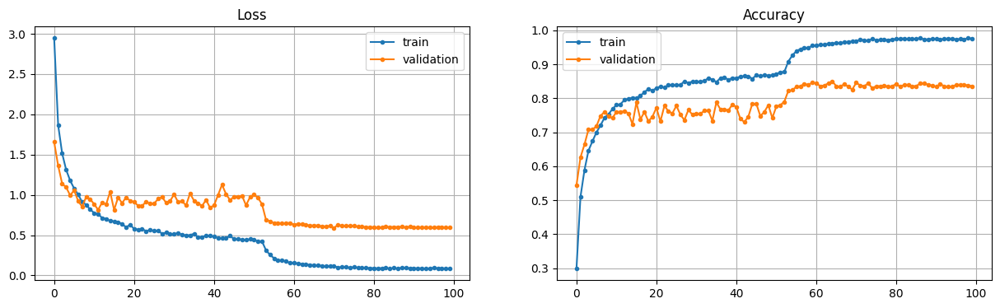

In [ ]:
fix, axes = plt.subplots(ncols=2, figsize=(15, 4))

axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
axes[0].plot(np.arange(len(valid_losses)), valid_losses, ".-")
axes[0].legend(["train", "validation"])
axes[0].set_title("Loss")
axes[0].grid()

axes[1].plot(np.arange(len(train_accuracies)), train_accuracies, ".-")
axes[1].plot(np.arange(len(valid_accuracies)), valid_accuracies, ".-")
axes[1].legend(["train", "validation"])
axes[1].set_title("Accuracy")
axes[1].grid();

### mobilenet v3 small imagenet v1

0.79 accuracy

In [ ]:
train_dataloader, valid_dataloader, test_dataloader, class_names = create_dataloaders(
                                train_dir=config.TRAIN_DIR,
#                                 add_dir = config.ADD_DIR,
                                val_dir=config.VAL_DIR,
                                test_dir=config.TEST_DIR,
                                train_transform=train_transforms,
                                val_transform=val_transforms,
                                test_transform=val_transforms,
                                batch_size=config.BATCH_SIZE)

[INFO] training dataset contains 13492 samples...
[INFO] validation dataset contains 500 samples...
[INFO] test dataset contains 500 samples...
[INFO] dataset contains 100 labels...
[INFO] creating training and validation set dataloaders...


In [ ]:

model = models.mobilenet_v3_small(weights=models.MobileNet_V3_Small_Weights.IMAGENET1K_V1)


Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth
100%|██████████| 9.83M/9.83M [00:00<00:00, 97.3MB/s]


In [ ]:
# model = model_0
model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay = 1e-4)

loss_fn = nn.CrossEntropyLoss()

scheduler2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.1, patience=3, verbose=True)
# lmbda = lambda epoch: 0.65 ** epoch
# scheduler1 = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)

Number of trainable parameters - 2542856
Device - cuda



In [ ]:
n_epochs = 100
# train_dataloader, valid_dataloader, test_dataloader, class_names
train_losses = []
train_accuracies = []

valid_losses = []
valid_accuracies = []

best_score = float("inf")

for ep in range(n_epochs):

    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_dataloader, loss_fn, optimizer, config.DEVICE, verbose=True)
    train_losses.append(np.mean(train_logs["losses"]))
    train_accuracies.append(np.mean(train_logs["accuracies"]))
    print("      loss:", train_losses[-1])
    print("  accuracy:", train_accuracies[-1])


    valid_logs = evaluate(model, valid_dataloader, loss_fn, config.DEVICE, verbose=True)
    valid_losses.append(np.mean(valid_logs["losses"]))
    valid_accuracies.append(np.mean(valid_logs["accuracies"]))
    print("      loss:", valid_losses[-1])
    print("  accuracy:", valid_accuracies[-1])
#     if ep <= 20:
#         scheduler1.step(valid_losses[-1])
#     else:
#         scheduler2.step(valid_losses[-1])
    if ep > 40:
        scheduler2.step(valid_losses[-1])
    if valid_losses[-1].mean() <= best_score:
        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "epoch": ep,
            "num_epochs": n_epochs,
            "metrics": {
                "training": {"loss": train_losses[-1], "accuracy": train_accuracies[-1]},
                "validation": {"loss": valid_losses[-1], "accuracy": valid_accuracies[-1]},
            },
        }
        torch.save(checkpoint, "/kaggle/working/best_mob.pth")
        print("🟢 Saved new best state! 🟢")
        best_score = valid_losses[-1].mean()  # update best score to a new one


Epoch  1/100
training: 100%|██████████████████████████████████████| 210/210 [00:27<00:00,  7.60it/s, loss 4.0338]
      loss: 5.386703962371463
  accuracy: 0.049181547
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00,  8.72it/s]
      loss: 3.7536605298519135
  accuracy: 0.138
🟢 Saved new best state! 🟢

Epoch  2/100
training: 100%|██████████████████████████████████████| 210/210 [00:27<00:00,  7.59it/s, loss 2.9760]
      loss: 3.5531088068371726
  accuracy: 0.18608631
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11.28it/s]
      loss: 2.64373642206192
  accuracy: 0.332
🟢 Saved new best state! 🟢

Epoch  3/100
training: 100%|██████████████████████████████████████| 210/210 [00:27<00:00,  7.71it/s, loss 2.4593]
      loss: 2.8642867871693203
  accuracy: 0.29813987
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11.44it/s]
      loss: 2.139604538679123
  accuracy: 

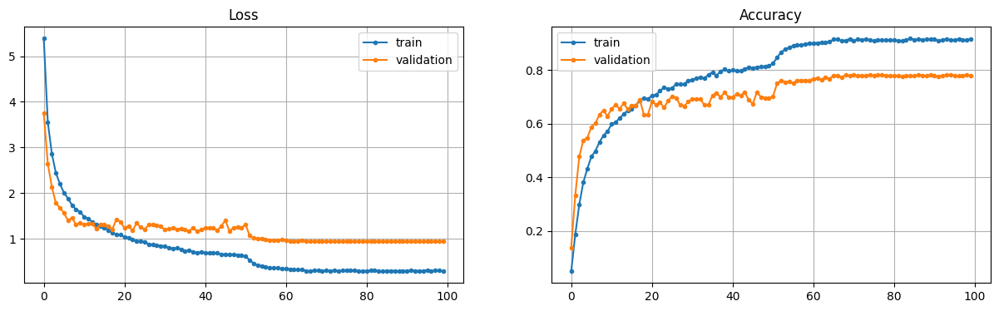

In [ ]:
fix, axes = plt.subplots(ncols=2, figsize=(15, 4))

axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
axes[0].plot(np.arange(len(valid_losses)), valid_losses, ".-")
axes[0].legend(["train", "validation"])
axes[0].set_title("Loss")
axes[0].grid()

axes[1].plot(np.arange(len(train_accuracies)), train_accuracies, ".-")
axes[1].plot(np.arange(len(valid_accuracies)), valid_accuracies, ".-")
axes[1].legend(["train", "validation"])
axes[1].set_title("Accuracy")
axes[1].grid();

## Test set

and balanced dataset

ResNet50

Average accuracy on test dataset: 89.6 %

In [ ]:
train_dataloader, valid_dataloader, test_dataloader, class_names = create_dataloaders(
                                train_dir=config.TRAIN_DIR,
#                                 add_dir = config.ADD_DIR,
                                val_dir=config.VAL_DIR,
                                test_dir=config.TEST_DIR,
                                train_transform=train_transforms,
                                val_transform=val_transforms,
                                test_transform=val_transforms,
                                batch_size=config.BATCH_SIZE)

model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

model.fc = nn.Linear(model.fc.in_features, config.NUM_CLASSES)

model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")

optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay = 1e-4)

loss_fn = nn.CrossEntropyLoss()

[INFO] training dataset contains 13492 samples...
[INFO] validation dataset contains 500 samples...
[INFO] test dataset contains 500 samples...
[INFO] dataset contains 100 labels...
[INFO] creating training and validation set dataloaders...
Number of trainable parameters - 23712932
Device - cpu



In [ ]:
checkpoint = torch.load('/kaggle/input/resnet-50/best50.pth',
                        map_location=torch.device(config.DEVICE))

# checkpoint = torch.load(PATH)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['metrics']['validation']['loss']

In [ ]:
test_logs = test(model, test_dataloader, loss_fn, config.DEVICE)


print('Average loss on test dataset:', round(np.mean(test_logs['losses']), 2))
print()
print('Average accuracy on test dataset:', round(np.mean(test_logs['accuracies'])*100, 2), '%')

Average loss on test dataset: 0.38

Average accuracy on test dataset: 89.6 %


In [ ]:
def denorm(img):
    return img * config.IMAGENET_MEAN[0] + config.IMAGENET_STD[0]

def plot_preds(test_set):
    fig = plt.figure(figsize=(20,16))
    axis = 1
    with torch.no_grad():
        for i, (x_batch, y_true) in enumerate(test_sample_dataloader):
            x = x_batch.to(config.DEVICE)
            y_true = y_true.to(config.DEVICE)

            y = model(x)
            pred = torch.argmax(y)
            ax = fig.add_subplot(4,4, axis)
            ax.set_xticks([])
            ax.set_yticks([])
#             img,_=test_set[i]
            plt.imshow(denorm(x_batch).squeeze().permute(1,2,0))
            axis += 1
            ax.set_title("label: {} \n pred: {} ".format(test_data.classes[y_true],
                                                         test_data.classes[pred]))

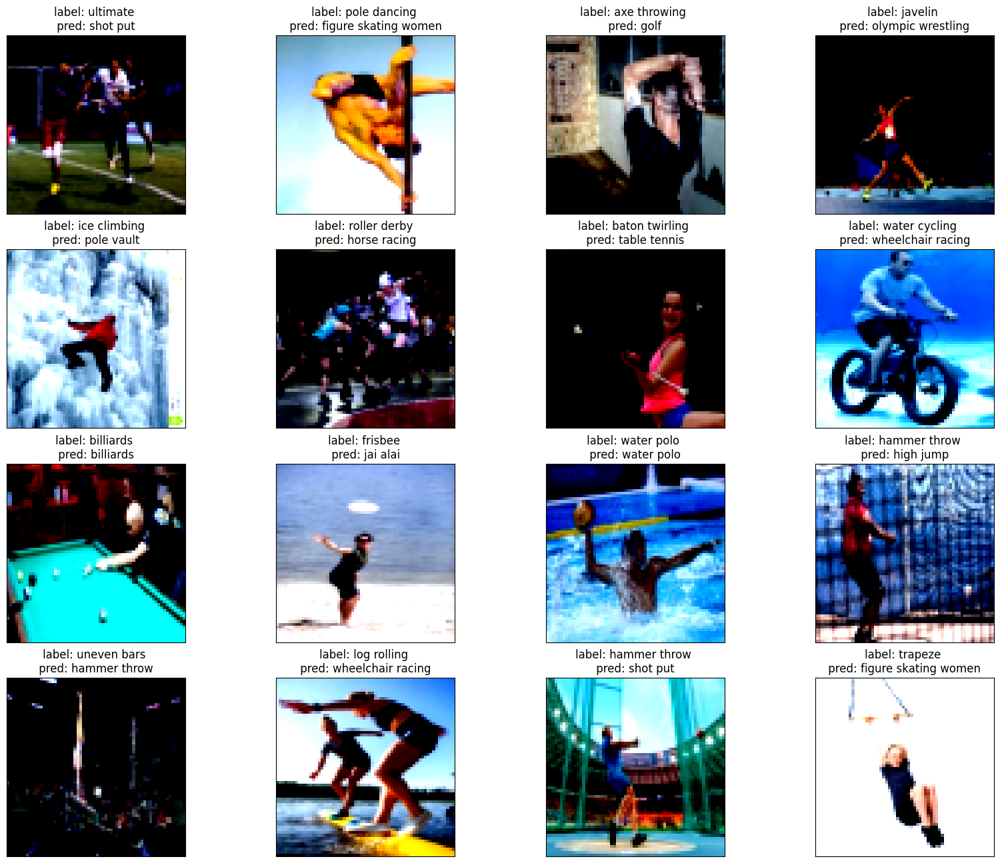

In [ ]:
test_data = datasets.ImageFolder(config.TEST_DIR, transform=val_transforms)
test_sample = Subset(test_data, np.random.randint(0, high = len(test_data), size = 16))

test_sample_dataloader = DataLoader(
      test_sample,
      batch_size=1,
      shuffle=False,
      drop_last=False)

plot_preds(test_sample_dataloader)

# Analyze and delete outliers from dataset

ResNet50, Average accuracy on test dataset: 87.2 %

In [ ]:
def check_outliers(dataset, size = 224, trans = False, kn = 20, metric = 'manhattan', contamination = 0.1, threshold = 0.75):
    '''
    function take dataframe, name of category and some values for outliers searching.
    Images convert to grayscale and flatten before using of lof from pyod
    args:
        size is a size of image; our images are 224 * 224; if we need other dimentions, please change size in temp variable
        if we want normalize data, we can switch trans to True but it is may be make slow of computation
        kn is a number of neighbours
        metric is ['euclidean', 'minkowski', 'cosine'] etc
        contamitation - wich percent we propose like outliers
        threshold is the limit then we say it is outlier
    return:
        list of outliers for each class
    '''
    outliers = []
    for idx in range(100):
        indexes = np.array([i for i in range(len(train)) if train.imgs[i][1] == idx])
        data = Subset(dataset, indexes)
        temp = np.empty((len(indexes), size**2))

        for j, (a, _) in enumerate(data):
            temp[j] = np.array(a.squeeze()).flatten()

        if trans == True: # if we need a normalize then use QuantileTransformer
            qt = QuantileTransformer(output_distribution = 'normal')
            temp = qt.fit_transform(temp)
        lof = LOF(n_neighbors=kn, metric = metric, contamination = contamination) # search outliers
        lof.fit(temp)
        probs = lof.predict_proba(temp)
        out = indexes[probs[:,1] > threshold] # check outliers by threshold
        outliers.append(out)

    return outliers

### Take the list with indexes of outliers by each class

In [ ]:
outliers = check_outliers(train, size = 224, trans = False, kn = 20, metric = 'manhattan', contamination = 0.1, threshold = 0.6)
outliers

[array([ 10,  14,  15,  26,  33,  34,  57,  59,  66,  76, 103, 105]),
 array([115, 119, 134, 139, 166, 168, 199, 212, 216]),
 array([228, 229, 243, 244, 279, 298, 307, 324, 329, 338, 339]),
 array([364, 378, 380, 384, 393, 405, 423, 426, 429, 432, 437, 439, 442,
        447, 450, 451]),
 array([455, 468, 492, 510, 566]),
 array([612, 627, 662, 668, 672]),
 array([798, 830]),
 array([ 845,  885,  907,  909,  913,  918,  920,  933,  943,  947,  967,
         977,  996, 1003, 1004, 1007]),
 array([1012, 1025, 1032, 1040, 1055, 1071, 1084, 1104, 1139, 1150, 1159,
        1166]),
 array([1181, 1186, 1212, 1218, 1222, 1239, 1244]),
 array([1328, 1330, 1367]),
 array([1405, 1406, 1408, 1426, 1429, 1461, 1485, 1508, 1529]),
 array([1633, 1659]),
 array([1697, 1720, 1743, 1762, 1772, 1780, 1790, 1815]),
 array([1856, 1860, 1883, 1903, 1904, 1914, 1929, 1941]),
 array([1964, 2017]),
 array([2094, 2095, 2105, 2108, 2111, 2126, 2127, 2164, 2169, 2182, 2187,
        2192, 2203]),
 array([2224, 2244

In [ ]:
outliers[0]

array([ 10,  14,  15,  26,  33,  34,  57,  59,  66,  76, 103, 105])

### See some outliers

In [ ]:
def example(dataset, outliers = outliers, index = 0):
    data = Subset(dataset, outliers[index])
    print('outliers form', dataset.classes[index])
    for img, _ in data:
        plt.imshow(img.permute(1,2,0))
        plt.show()

outliers form air hockey


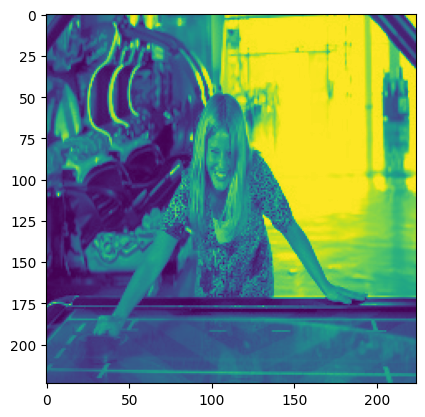

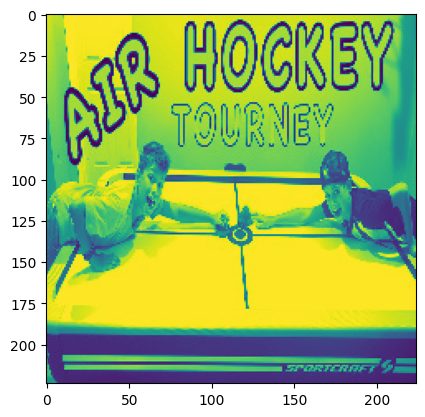

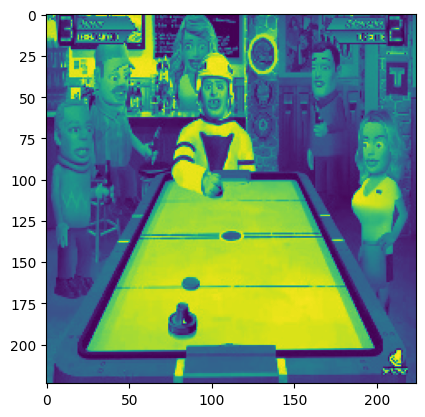

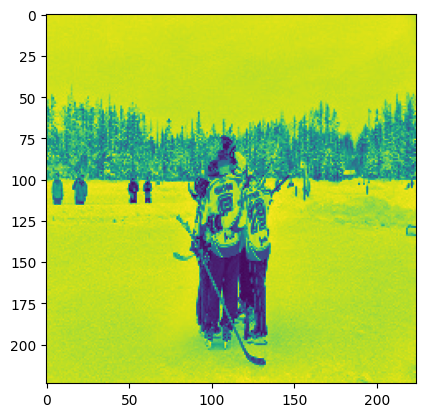

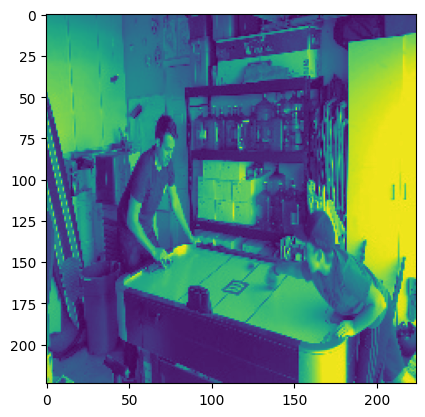

...

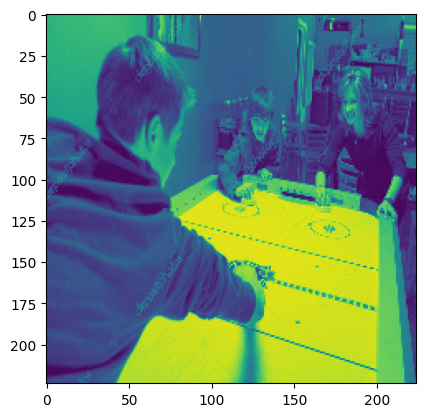

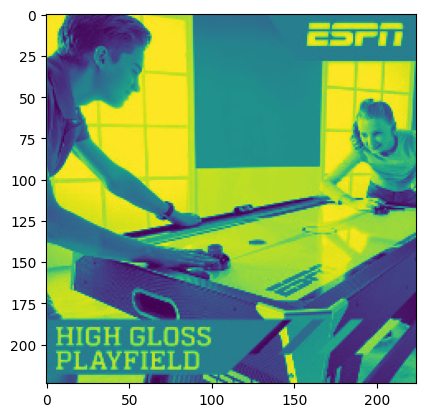

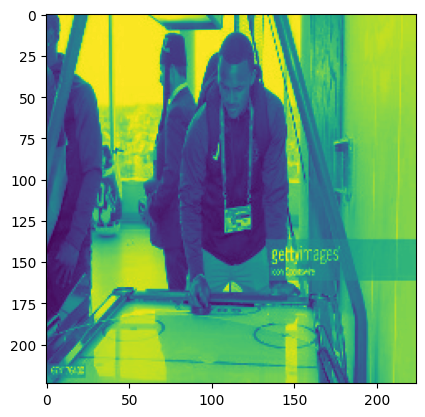

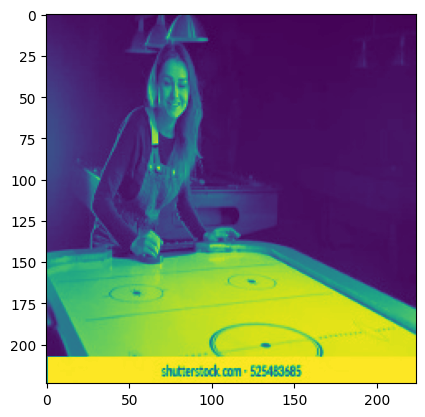

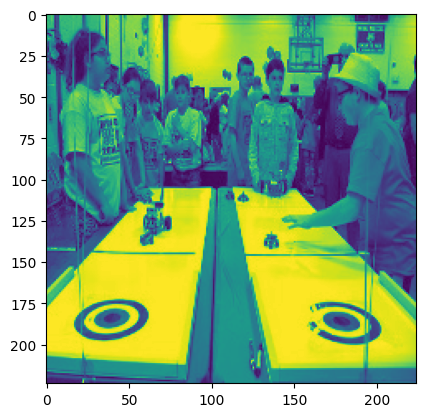

In [ ]:
example(train, outliers, 0)

We see and real hockey, and image from game, and image with big text.

outliers form archery


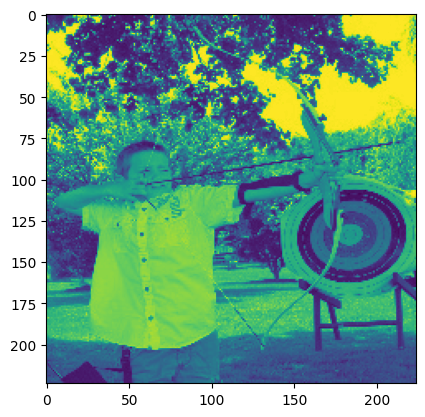

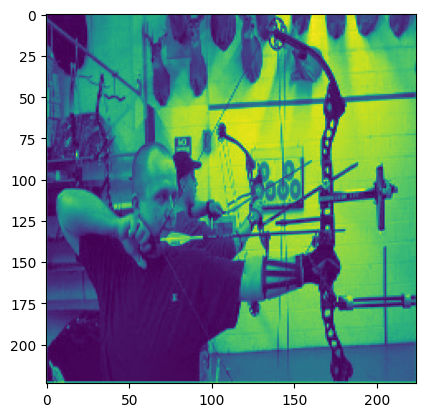

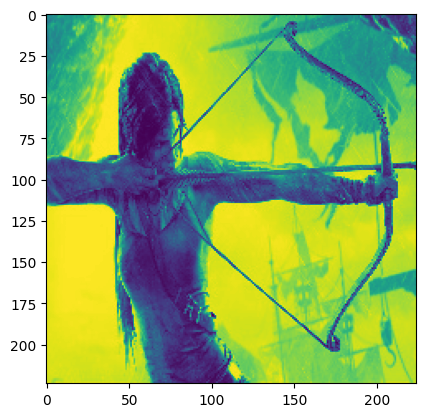

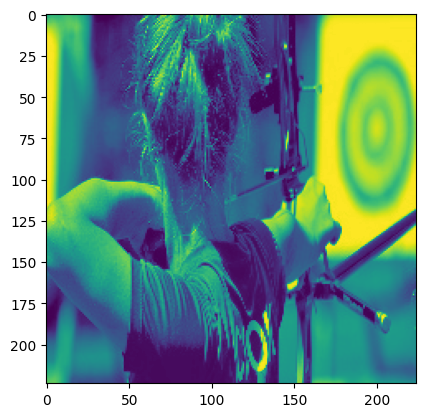

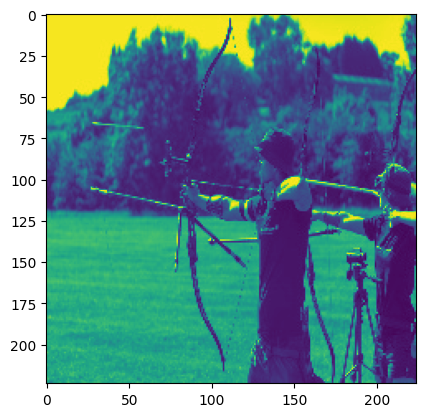

...

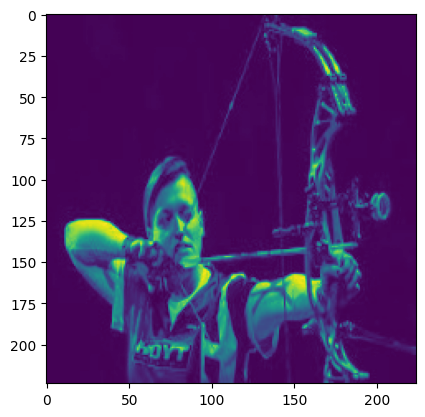

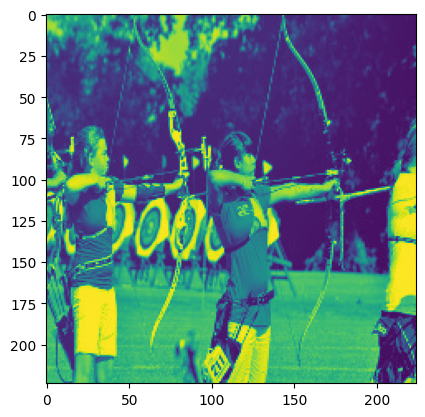

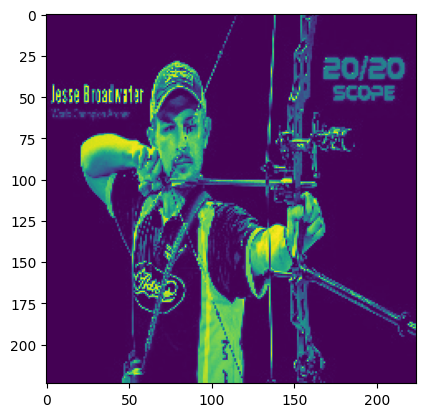

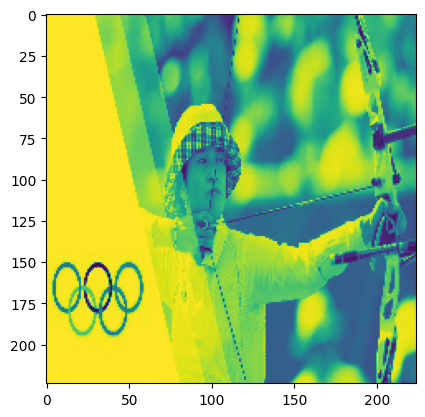

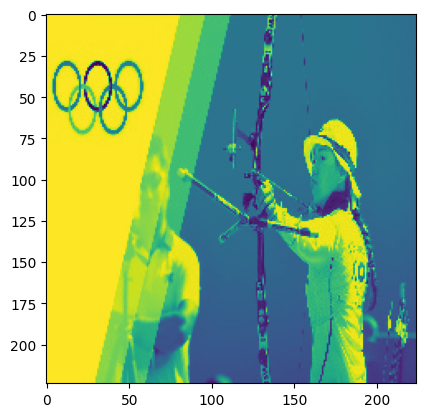

In [ ]:
example(train, outliers, 2)

### Delete outliers from dataset

use Subset before DataLoader

In [ ]:
class config:
    # specify the paths to datasets
    DOWNLOAD_DIR = Path('../input/sports-classification')
#     DOWNLOAD_DIR = Path('../input')
    TRAIN_DIR = DOWNLOAD_DIR.joinpath('train')
#     ADD_DIR = '/kaggle/working/aug'
    VAL_DIR = DOWNLOAD_DIR.joinpath('valid')
    TEST_DIR = DOWNLOAD_DIR.joinpath('test')

    # set the input height and width
    INPUT_HEIGHT = 64 # 224
    INPUT_WIDTH = 64 # 224

    # set the input heig/ht and width
    IMAGENET_MEAN = [0.485, 0.456, 0.406]
    IMAGENET_STD = [0.229, 0.224, 0.225]

    IMAGE_TYPE = '.jpg'
    BATCH_SIZE = 64
    MODEL_NAME = 'vit_base'
    DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
    TRAINING_PARAMS = 'training_hyperparams/imagenet_vit_train_params'

    NUM_CLASSES = 100
    CHECKPOINT_DIR = 'checkpoints'

In [ ]:
# initialize our data augmentation functions
resize = transforms.Resize(size=(config.INPUT_HEIGHT,config.INPUT_WIDTH))
make_tensor = transforms.ToTensor()
normalize = transforms.Normalize(mean=config.IMAGENET_MEAN, std=config.IMAGENET_STD)
center_cropper = transforms.CenterCrop((config.INPUT_HEIGHT,config.INPUT_WIDTH))
random_horizontal_flip = transforms.RandomHorizontalFlip(p=0.75)
random_vertical_flip = transforms.RandomVerticalFlip(p=0.75)
random_rotation = transforms.RandomRotation(degrees=90)
random_crop = transforms.RandomCrop(size=(200,200))
augmix = transforms.AugMix(severity = 3, mixture_width=3, alpha=0.2)
auto_augment = transforms.AutoAugment()
random_augment = transforms.RandAugment()


train_transforms = transforms.Compose([
  resize,
  auto_augment,
  random_augment,
  make_tensor,
  normalize
])

val_transforms = transforms.Compose([resize, make_tensor, normalize])
# make_tensor = transforms.ToTensor()

In [ ]:
def create_dataloaders(
    train_dir: str,
#     add_dir: str,
    val_dir: str,
    test_dir: str,
    train_transform: transforms.Compose,
    val_transform:  transforms.Compose,
    test_transform:  transforms.Compose,
    batch_size: int,
    num_workers: int=2,
    indexes_to_include: list = None
):
  """Creates training and validation DataLoaders.
  Args:
    train_dir: Path to training data.
    val_dir: Path to validation data.
    transform: Transformation pipeline.
    batch_size: Number of samples per batch in each of the DataLoaders.
    num_workers: An integer for number of workers per DataLoader.
  Returns:
    A tuple of (train_dataloader, val_dataloader, class_names).
  """
  # Use ImageFolder to create dataset
#   l = []
#   train_data1 = datasets.ImageFolder(train_dir, transform=train_transform)
#   l.append(train_data1)
#   train_data2 = datasets.ImageFolder(add_dir, transform=train_transform)
#   l.append(train_data2)
#   image_datasets = torch.utils.data.ConcatDataset(l)
  train_data = datasets.ImageFolder(train_dir, transform=train_transform)
  # Get class names
  class_names = train_data.classes
  train_data = Subset(train_data,indexes_to_include)

  val_data = datasets.ImageFolder(val_dir, transform=val_transform)

  test_data = datasets.ImageFolder(test_dir, transform=val_transform)
    #   train_data = Subset(train_data,indexes_to_include)

  print(f"[INFO] training dataset contains {len(train_data)} samples...")
  print(f"[INFO] validation dataset contains {len(val_data)} samples...")
  print(f"[INFO] test dataset contains {len(test_data)} samples...")

  print(f"[INFO] dataset contains {len(class_names)} labels...")

  # Turn images into data loaders
  print("[INFO] creating training and validation set dataloaders...")
  train_dataloader = DataLoader(
      train_data,
      batch_size=batch_size,
      shuffle=True,
      drop_last=True,
      num_workers=num_workers,
      pin_memory=True,
      persistent_workers=True,
#       sampler=ImbalancedDatasetSampler(train_data)
  )
  val_dataloader = DataLoader(
      val_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
      drop_last=False,
      persistent_workers=True
  )

  test_dataloader = DataLoader(
      test_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
      drop_last=False,
      persistent_workers=True
  )

  return train_dataloader, val_dataloader, test_dataloader, class_names

In [ ]:
originals = np.load('/kaggle/input/without-outliers/originals.npy')

In [ ]:
originals

array([    0,     1,     2, ..., 13489, 13490, 13491])

In [ ]:
train_dataloader, valid_dataloader, test_dataloader, class_names = create_dataloaders(
                                train_dir=config.TRAIN_DIR,
#                                 add_dir = config.ADD_DIR,
                                val_dir=config.VAL_DIR,
                                test_dir=config.TEST_DIR,
                                train_transform=train_transforms,
                                val_transform=val_transforms,
                                test_transform=val_transforms,
                                batch_size=config.BATCH_SIZE,
                                indexes_to_include = originals)

[INFO] training dataset contains 12789 samples...
[INFO] validation dataset contains 500 samples...
[INFO] test dataset contains 500 samples...
[INFO] dataset contains 100 labels...
[INFO] creating training and validation set dataloaders...


### Traine model without outliers in data

Use ResNet50 with best results in previous tests.

In [ ]:
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

model.fc = nn.Linear(model.fc.in_features, config.NUM_CLASSES)

In [ ]:
# model = model_0
model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay = 1e-4)

loss_fn = nn.CrossEntropyLoss()

scheduler2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.1, patience=3, verbose=True)
# lmbda = lambda epoch: 0.65 ** epoch
# scheduler1 = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)

Number of trainable parameters - 23712932
Device - cuda



In [ ]:
n_epochs = 100
# train_dataloader, valid_dataloader, test_dataloader, class_names
train_losses = []
train_accuracies = []

valid_losses = []
valid_accuracies = []

best_score = float("inf")

for ep in range(n_epochs):

    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_dataloader, loss_fn, optimizer, config.DEVICE, verbose=True)
    train_losses.append(np.mean(train_logs["losses"]))
    train_accuracies.append(np.mean(train_logs["accuracies"]))
    print("      loss:", train_losses[-1])
    print("  accuracy:", train_accuracies[-1])


    valid_logs = evaluate(model, valid_dataloader, loss_fn, config.DEVICE, verbose=True)
    valid_losses.append(np.mean(valid_logs["losses"]))
    valid_accuracies.append(np.mean(valid_logs["accuracies"]))
    print("      loss:", valid_losses[-1])
    print("  accuracy:", valid_accuracies[-1])
#     if ep <= 20:
#         scheduler1.step(valid_losses[-1])
#     else:
#         scheduler2.step(valid_losses[-1])
    if ep > 50:
        scheduler2.step(valid_losses[-1])
    if valid_losses[-1].mean() <= best_score:
        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "epoch": ep,
            "num_epochs": n_epochs,
            "metrics": {
                "training": {"loss": train_losses[-1], "accuracy": train_accuracies[-1]},
                "validation": {"loss": valid_losses[-1], "accuracy": valid_accuracies[-1]},
            },
        }
        torch.save(checkpoint, "/kaggle/working/best50.pth")
        print("🟢 Saved new best state! 🟢")
        best_score = valid_losses[-1].mean()  # update best score to a new one


Epoch  1/100
training: 100%|██████████████████████████████████████| 199/199 [00:29<00:00,  6.83it/s, loss 2.3938]
      loss: 3.038451476312762
  accuracy: 0.2727701
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10.20it/s]
      loss: 1.6179479956626892
  accuracy: 0.572
🟢 Saved new best state! 🟢

Epoch  2/100
training: 100%|██████████████████████████████████████| 199/199 [00:28<00:00,  7.09it/s, loss 1.7171]
      loss: 1.95779822819197
  accuracy: 0.48107725
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.65it/s]
      loss: 1.423274576663971
  accuracy: 0.59
🟢 Saved new best state! 🟢

Epoch  3/100
training: 100%|██████████████████████████████████████| 199/199 [00:27<00:00,  7.18it/s, loss 1.4860]
      loss: 1.607974247716779
  accuracy: 0.5643059
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.24it/s]
      loss: 1.2498778030276299
  accuracy: 0.64


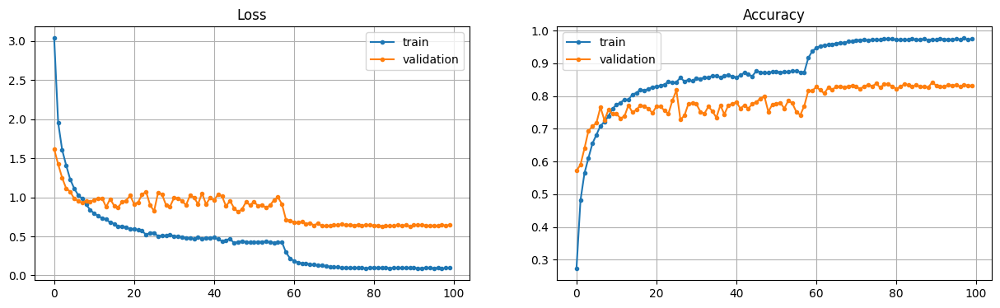

In [ ]:
fix, axes = plt.subplots(ncols=2, figsize=(15, 4))

axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
axes[0].plot(np.arange(len(valid_losses)), valid_losses, ".-")
axes[0].legend(["train", "validation"])
axes[0].set_title("Loss")
axes[0].grid()

axes[1].plot(np.arange(len(train_accuracies)), train_accuracies, ".-")
axes[1].plot(np.arange(len(valid_accuracies)), valid_accuracies, ".-")
axes[1].legend(["train", "validation"])
axes[1].set_title("Accuracy")
axes[1].grid();

In [ ]:
test_logs = test(model, test_dataloader, loss_fn, config.DEVICE)


print('Average loss on test dataset:', round(np.mean(test_logs['losses']), 2))
print()
print('Average accuracy on test dataset:', round(np.mean(test_logs['accuracies'])*100, 2), '%')

Average loss on test dataset: 0.5

Average accuracy on test dataset: 87.2 %


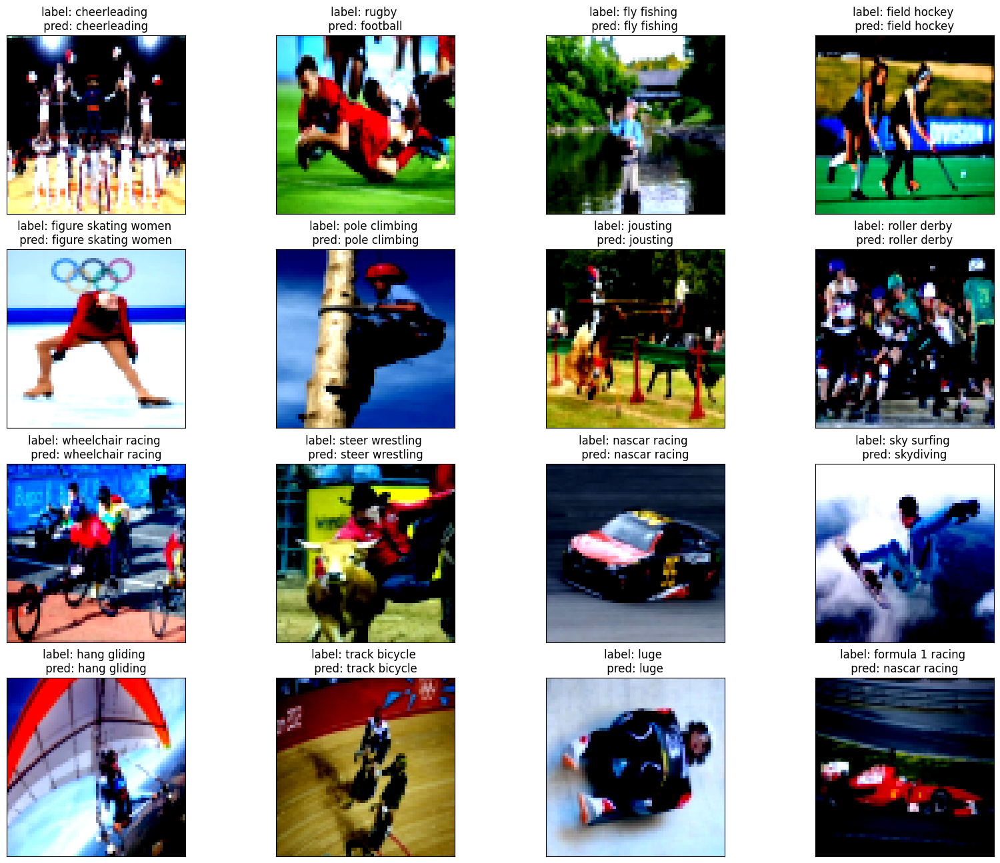

In [ ]:
test_data = datasets.ImageFolder(config.TEST_DIR, transform=val_transforms)
test_sample = Subset(test_data, np.random.randint(0, high = len(test_data), size = 16))

test_sample_dataloader = DataLoader(
      test_sample,
      batch_size=1,
      shuffle=False,
      drop_last=False)

plot_preds(test_sample_dataloader)

# Using of original imbalanced dataset

ResNet50

Average accuracy on test dataset: 89.4 %

In [ ]:
def create_dataloaders(
    train_dir: str,
#     add_dir: str,
    val_dir: str,
    test_dir: str,
    train_transform: transforms.Compose,
    val_transform:  transforms.Compose,
    test_transform:  transforms.Compose,
    batch_size: int,
    num_workers: int=2,
#     indexes_to_include: list = None
):
  """Creates training and validation DataLoaders.
  Args:
    train_dir: Path to training data.
    val_dir: Path to validation data.
    transform: Transformation pipeline.
    batch_size: Number of samples per batch in each of the DataLoaders.
    num_workers: An integer for number of workers per DataLoader.
  Returns:
    A tuple of (train_dataloader, val_dataloader, class_names).
  """
  # Use ImageFolder to create dataset
#   l = []
#   train_data1 = datasets.ImageFolder(train_dir, transform=train_transform)
#   l.append(train_data1)
#   train_data2 = datasets.ImageFolder(add_dir, transform=train_transform)
#   l.append(train_data2)
#   image_datasets = torch.utils.data.ConcatDataset(l)
  train_data = datasets.ImageFolder(train_dir, transform=train_transform)
  # Get class names
  class_names = train_data.classes
#   train_data = Subset(train_data,indexes_to_include)

  val_data = datasets.ImageFolder(val_dir, transform=val_transform)

  test_data = datasets.ImageFolder(test_dir, transform=val_transform)
    #   train_data = Subset(train_data,indexes_to_include)

  print(f"[INFO] training dataset contains {len(train_data)} samples...")
  print(f"[INFO] validation dataset contains {len(val_data)} samples...")
  print(f"[INFO] test dataset contains {len(test_data)} samples...")

  print(f"[INFO] dataset contains {len(class_names)} labels...")

  # Turn images into data loaders
  print("[INFO] creating training and validation set dataloaders...")
  train_dataloader = DataLoader(
      train_data,
      batch_size=batch_size,
      shuffle=True,
      drop_last=True,
      num_workers=num_workers,
      pin_memory=True,
      persistent_workers=True,
#       sampler=ImbalancedDatasetSampler(train_data)
  )
  val_dataloader = DataLoader(
      val_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
      drop_last=False,
      persistent_workers=True
  )

  test_dataloader = DataLoader(
      test_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
      drop_last=False,
      persistent_workers=True
  )

  return train_dataloader, val_dataloader, test_dataloader, class_names

In [ ]:
train_dataloader, valid_dataloader, test_dataloader, class_names = create_dataloaders(
                                train_dir=config.TRAIN_DIR,
#                                 add_dir = config.ADD_DIR,
                                val_dir=config.VAL_DIR,
                                test_dir=config.TEST_DIR,
                                train_transform=train_transforms,
                                val_transform=val_transforms,
                                test_transform=val_transforms,
                                batch_size=config.BATCH_SIZE,
                                )

[INFO] training dataset contains 13492 samples...
[INFO] validation dataset contains 500 samples...
[INFO] test dataset contains 500 samples...
[INFO] dataset contains 100 labels...
[INFO] creating training and validation set dataloaders...


In [ ]:
model2 = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

model = model2

model.fc = nn.Linear(model.fc.in_features, config.NUM_CLASSES)

In [ ]:
# model = model_0
model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay = 1e-4)

loss_fn = nn.CrossEntropyLoss()

scheduler2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.1, patience=3, verbose=True)
# lmbda = lambda epoch: 0.65 ** epoch
# scheduler1 = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)

Number of trainable parameters - 23712932
Device - cuda



In [ ]:
n_epochs = 100
# train_dataloader, valid_dataloader, test_dataloader, class_names
train_losses = []
train_accuracies = []

valid_losses = []
valid_accuracies = []

best_score = float("inf")


for ep in range(n_epochs):

    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_dataloader, loss_fn, optimizer, config.DEVICE, verbose=True)
    train_losses.append(np.mean(train_logs["losses"]))
    train_accuracies.append(np.mean(train_logs["accuracies"]))
    print("      loss:", train_losses[-1])
    print("  accuracy:", train_accuracies[-1])


    valid_logs = evaluate(model, valid_dataloader, loss_fn, config.DEVICE, verbose=True)
    valid_losses.append(np.mean(valid_logs["losses"]))
    valid_accuracies.append(np.mean(valid_logs["accuracies"]))
    print("      loss:", valid_losses[-1])
    print("  accuracy:", valid_accuracies[-1])
#     if ep <= 20:
#         scheduler1.step(valid_losses[-1])
#     else:
#         scheduler2.step(valid_losses[-1])
    if ep > 50:
        scheduler2.step(valid_losses[-1])
    if valid_losses[-1].mean() <= best_score:
        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "epoch": ep,
            "num_epochs": n_epochs,
            "metrics": {
                "training": {"loss": train_losses[-1], "accuracy": train_accuracies[-1]},
                "validation": {"loss": valid_losses[-1], "accuracy": valid_accuracies[-1]},
            },
        }
        torch.save(checkpoint, "/kaggle/working/best50.pth")
        print("🟢 Saved new best state! 🟢")
        best_score = valid_losses[-1].mean()  # update best score to a new one


Epoch  1/100
training: 100%|██████████████████████████████████████| 210/210 [00:29<00:00,  7.08it/s, loss 2.4370]
      loss: 3.0782797268458775
  accuracy: 0.2581101
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.44it/s]
      loss: 1.686671331524849
  accuracy: 0.51
🟢 Saved new best state! 🟢

Epoch  2/100
training: 100%|██████████████████████████████████████| 210/210 [00:29<00:00,  7.07it/s, loss 2.2153]
      loss: 2.032980209305173
  accuracy: 0.46636903
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10.92it/s]
      loss: 1.3611547276377678
  accuracy: 0.634
🟢 Saved new best state! 🟢

Epoch  3/100
training: 100%|██████████████████████████████████████| 210/210 [00:29<00:00,  7.19it/s, loss 1.6529]
      loss: 1.6429465594745818
  accuracy: 0.55089283
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.69it/s]
      loss: 1.0287327989935875
  accuracy: 0

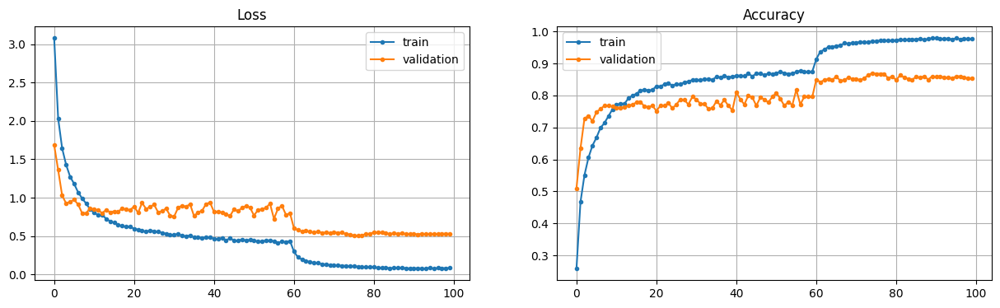

In [ ]:
fix, axes = plt.subplots(ncols=2, figsize=(15, 4))

axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
axes[0].plot(np.arange(len(valid_losses)), valid_losses, ".-")
axes[0].legend(["train", "validation"])
axes[0].set_title("Loss")
axes[0].grid()

axes[1].plot(np.arange(len(train_accuracies)), train_accuracies, ".-")
axes[1].plot(np.arange(len(valid_accuracies)), valid_accuracies, ".-")
axes[1].legend(["train", "validation"])
axes[1].set_title("Accuracy")
axes[1].grid();

In [ ]:
test_logs = test(model, test_dataloader, loss_fn, config.DEVICE)


print('Average loss on test dataset:', round(np.mean(test_logs['losses']), 2))
print()
print('Average accuracy on test dataset:', round(np.mean(test_logs['accuracies'])*100, 2), '%')

Average loss on test dataset: 0.37

Average accuracy on test dataset: 89.4 %


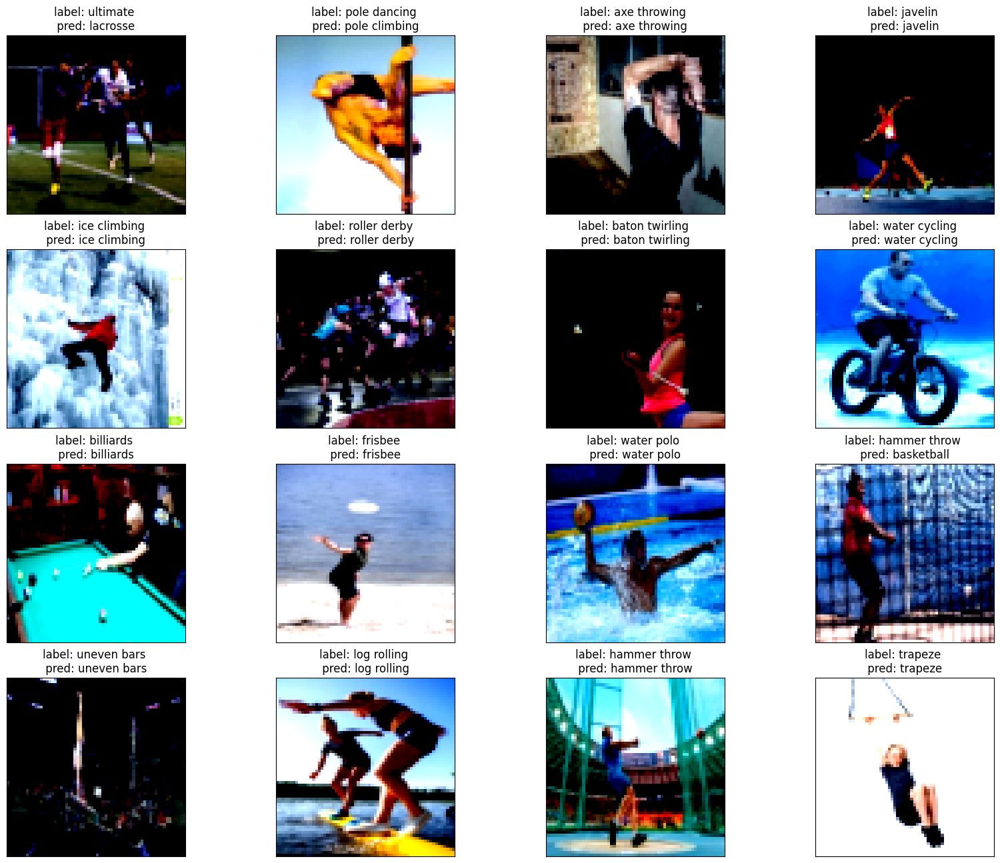

In [ ]:
test_data = datasets.ImageFolder(config.TEST_DIR, transform=val_transforms)
test_sample = Subset(test_data, np.random.randint(0, high = len(test_data), size = 16))

test_sample_dataloader = DataLoader(
      test_sample,
      batch_size=1,
      shuffle=False,
      drop_last=False)

plot_preds(test_sample_dataloader)

# Using edge detection filters for datasets

Assumption: if we take edges then we increase accuracy.

## Edges from one image

In [ ]:
import cv2

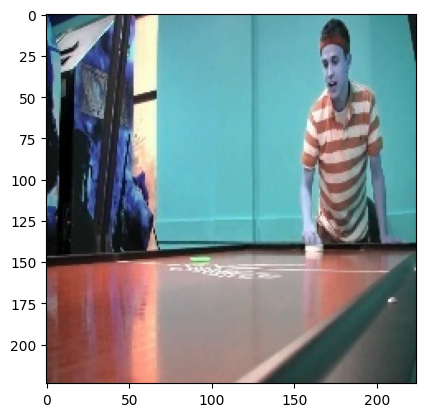

In [ ]:
# Read the original image
img = cv2.imread('/kaggle/input/sports-classification/train/air hockey/001.jpg', cv2.IMREAD_COLOR)
plt.imshow(img);

#### give grayscale mode

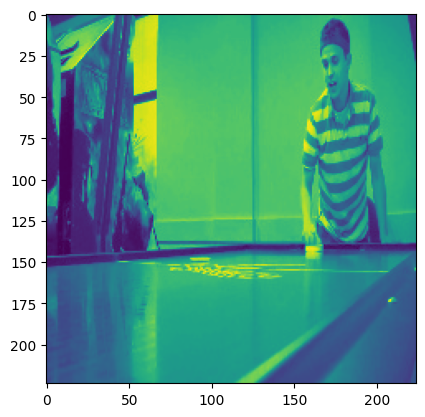

In [ ]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(img_gray);

#### give some blur

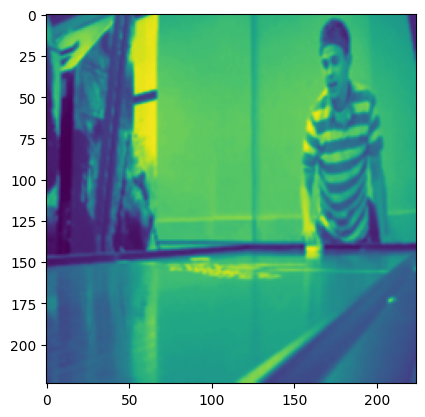

In [ ]:
img_blur = cv2.GaussianBlur(img_gray,(3,3), 0)
plt.imshow(img_blur);

#### take edges

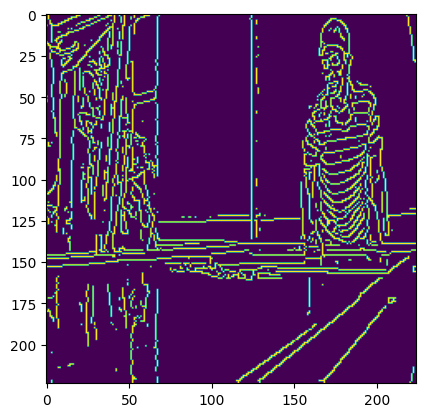

In [ ]:
edges = cv2.Canny(image=img_blur, threshold1=50, threshold2=50)
plt.imshow(edges);

#### Create function that get edges.

In [ ]:
def get_canny(img):
    '''
    create edges from image
    '''
    img = im_to_np(img)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_blur = cv2.GaussianBlur(img_gray,(3,3), 0)
    edges = cv2.Canny(image=img_blur, threshold1=50, threshold2=50)
    return edges

In [ ]:
preprocess = transforms.Compose([
                                transforms.Lambda(get_canny)])

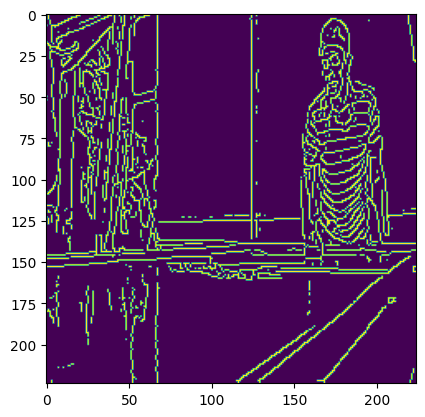

In [ ]:
plt.imshow(preprocess(img))

### Add function in the transforms:

In [ ]:
# initialize our data augmentation functions
resize = transforms.Resize(size=(config.INPUT_HEIGHT,config.INPUT_WIDTH))
make_tensor = transforms.ToTensor()
normalize = transforms.Normalize(mean=config.IMAGENET_MEAN, std=config.IMAGENET_STD)
center_cropper = transforms.CenterCrop((config.INPUT_HEIGHT,config.INPUT_WIDTH))
random_horizontal_flip = transforms.RandomHorizontalFlip(p=0.75)
random_vertical_flip = transforms.RandomVerticalFlip(p=0.75)
random_rotation = transforms.RandomRotation(degrees=90)
random_crop = transforms.RandomCrop(size=(200,200))
augmix = transforms.AugMix(severity = 3, mixture_width=3, alpha=0.2)
auto_augment = transforms.AutoAugment()
random_augment = transforms.RandAugment()


train_transforms = transforms.Compose([
  transforms.Lambda(get_canny), # our function of edge detection
  transforms.ToPILImage(), # convert image in the needed format
  resize,
  auto_augment,
  random_augment,
  make_tensor,
#   normalize
])

val_transforms = transforms.Compose([transforms.Lambda(get_canny), # our function
                                    transforms.ToPILImage(), # convert in needed format
                                     resize, make_tensor,
#                                      normalize
                                    ])
# make_tensor = transforms.ToTensor()

In [ ]:
def create_dataloaders(
    train_dir: str,
#     add_dir: str,
    val_dir: str,
    test_dir: str,
    train_transform: transforms.Compose,
    val_transform:  transforms.Compose,
    test_transform:  transforms.Compose,
    batch_size: int,
    num_workers: int=2,
    indexes_to_include: list = None
):
  """Creates training and validation DataLoaders.
  Args:
    train_dir: Path to training data.
    val_dir: Path to validation data.
    transform: Transformation pipeline.
    batch_size: Number of samples per batch in each of the DataLoaders.
    num_workers: An integer for number of workers per DataLoader.
  Returns:
    A tuple of (train_dataloader, val_dataloader, class_names).
  """
  # Use ImageFolder to create dataset
#   l = []
#   train_data1 = datasets.ImageFolder(train_dir, transform=train_transform)
#   l.append(train_data1)
#   train_data2 = datasets.ImageFolder(add_dir, transform=train_transform)
#   l.append(train_data2)
#   image_datasets = torch.utils.data.ConcatDataset(l)
  train_data = datasets.ImageFolder(train_dir, transform=train_transform)
  # Get class names
  class_names = train_data.classes

  val_data = datasets.ImageFolder(val_dir, transform=val_transform)

  test_data = datasets.ImageFolder(test_dir, transform=val_transform)
    #   train_data = Subset(train_data,indexes_to_include)

  print(f"[INFO] training dataset contains {len(train_data)} samples...")
  print(f"[INFO] validation dataset contains {len(val_data)} samples...")
  print(f"[INFO] test dataset contains {len(test_data)} samples...")

  print(f"[INFO] dataset contains {len(class_names)} labels...")

  # Turn images into data loaders
  print("[INFO] creating training and validation set dataloaders...")
  train_dataloader = DataLoader(
      train_data,
      batch_size=batch_size,
      shuffle=True,
      drop_last=True,
      num_workers=num_workers,
      pin_memory=True,
      persistent_workers=True,
#       sampler=ImbalancedDatasetSampler(train_data)
  )
  val_dataloader = DataLoader(
      val_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
      drop_last=False,
      persistent_workers=True
  )

  test_dataloader = DataLoader(
      test_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
      drop_last=False,
      persistent_workers=True
  )

  return train_dataloader, val_dataloader, test_dataloader, class_names

In [ ]:
train_dataloader, valid_dataloader, test_dataloader, class_names = create_dataloaders(
                                train_dir=config.TRAIN_DIR,
#                                 add_dir = config.ADD_DIR,
                                val_dir=config.VAL_DIR,
                                test_dir=config.TEST_DIR,
                                train_transform=train_transforms,
                                val_transform=val_transforms,
                                test_transform=val_transforms,
                                batch_size=config.BATCH_SIZE,
                                )

[INFO] training dataset contains 13492 samples...
[INFO] validation dataset contains 500 samples...
[INFO] test dataset contains 500 samples...
[INFO] dataset contains 100 labels...
[INFO] creating training and validation set dataloaders...


### Train model on edged dataset

Use best model ResNet50

In [ ]:
model2 = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

model = model2

model.fc = nn.Linear(model.fc.in_features, config.NUM_CLASSES)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 79.2MB/s]


#### Change first layer to one channel image

In [ ]:
model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)

In [ ]:
# model = model_0
model = model.to(config.DEVICE)
print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(f"Device - {config.DEVICE}\n")
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay = 1e-4)

loss_fn = nn.CrossEntropyLoss()

scheduler2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.1, patience=3, verbose=True)
# lmbda = lambda epoch: 0.65 ** epoch
# scheduler1 = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)

Number of trainable parameters - 23706660
Device - cpu



In [ ]:
n_epochs = 100
# train_dataloader, valid_dataloader, test_dataloader, class_names
train_losses = []
train_accuracies = []

valid_losses = []
valid_accuracies = []

best_score = float("inf")


for ep in range(n_epochs):

    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_dataloader, loss_fn, optimizer, config.DEVICE, verbose=True)
    train_losses.append(np.mean(train_logs["losses"]))
    train_accuracies.append(np.mean(train_logs["accuracies"]))
    print("      loss:", train_losses[-1])
    print("  accuracy:", train_accuracies[-1])


    valid_logs = evaluate(model, valid_dataloader, loss_fn, config.DEVICE, verbose=True)
    valid_losses.append(np.mean(valid_logs["losses"]))
    valid_accuracies.append(np.mean(valid_logs["accuracies"]))
    print("      loss:", valid_losses[-1])
    print("  accuracy:", valid_accuracies[-1])
#     if ep <= 20:
#         scheduler1.step(valid_losses[-1])
#     else:
#         scheduler2.step(valid_losses[-1])
    if ep > 50:
        scheduler2.step(valid_losses[-1])
    if valid_losses[-1].mean() <= best_score:
        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "epoch": ep,
            "num_epochs": n_epochs,
            "metrics": {
                "training": {"loss": train_losses[-1], "accuracy": train_accuracies[-1]},
                "validation": {"loss": valid_losses[-1], "accuracy": valid_accuracies[-1]},
            },
        }
        torch.save(checkpoint, "/kaggle/working/best50.pth")
        print("🟢 Saved new best state! 🟢")
        best_score = valid_losses[-1].mean()  # update best score to a new one


Epoch  1/100
training: 100%|██████████████████████████████████████| 210/210 [00:47<00:00,  4.39it/s, loss 4.2461]
      loss: 4.437143802642822
  accuracy: 0.03311012
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:01<00:00,  6.15it/s]
      loss: 4.116961121559143
  accuracy: 0.06
🟢 Saved new best state! 🟢

Epoch  2/100
training: 100%|██████████████████████████████████████| 210/210 [00:47<00:00,  4.38it/s, loss 4.0317]
      loss: 4.130077410879589
  accuracy: 0.06666667
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:01<00:00,  6.37it/s]
      loss: 3.939363807439804
  accuracy: 0.11
🟢 Saved new best state! 🟢

Epoch  3/100
training: 100%|██████████████████████████████████████| 210/210 [00:47<00:00,  4.43it/s, loss 3.6024]
      loss: 3.8848237571262176
  accuracy: 0.106919646
evaluation: 100%|█████████████████████████████████████████████████████| 8/8 [00:01<00:00,  6.65it/s]
      loss: 3.5267715752124786
  accuracy: 0.

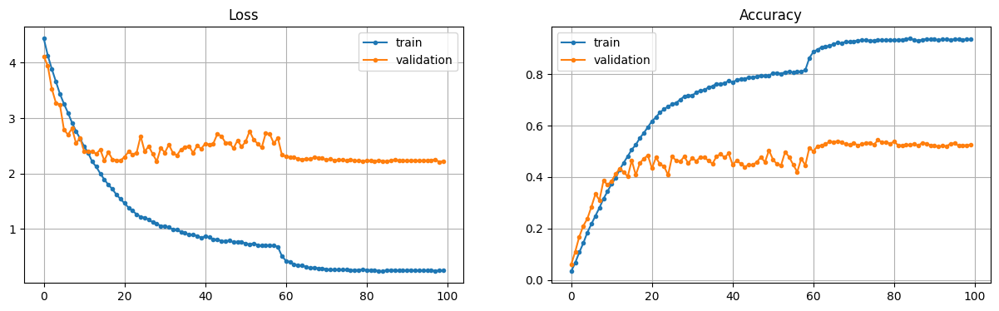

In [ ]:
fix, axes = plt.subplots(ncols=2, figsize=(15, 4))

axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
axes[0].plot(np.arange(len(valid_losses)), valid_losses, ".-")
axes[0].legend(["train", "validation"])
axes[0].set_title("Loss")
axes[0].grid()

axes[1].plot(np.arange(len(train_accuracies)), train_accuracies, ".-")
axes[1].plot(np.arange(len(valid_accuracies)), valid_accuracies, ".-")
axes[1].legend(["train", "validation"])
axes[1].set_title("Accuracy")
axes[1].grid();

In [ ]:
test_logs = test(model, test_dataloader, loss_fn, config.DEVICE)


print('Average loss on test dataset:', round(np.mean(test_logs['losses']), 2))
print()
print('Average accuracy on test dataset:', round(np.mean(test_logs['accuracies'])*100, 2), '%')

Average loss on test dataset: 1.96

Average accuracy on test dataset: 57.4 %


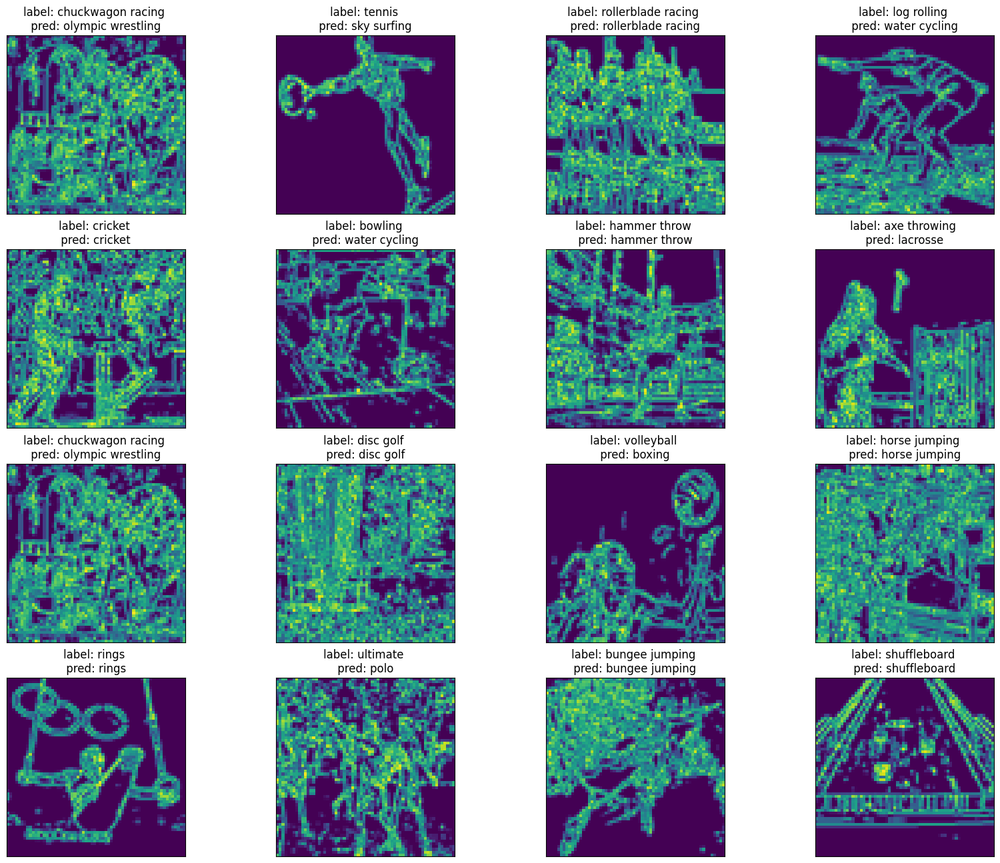

In [ ]:
test_data = datasets.ImageFolder(config.TEST_DIR, transform=val_transforms)
test_sample = Subset(test_data, np.random.randint(0, high = len(test_data), size = 16))

test_sample_dataloader = DataLoader(
      test_sample,
      batch_size=1,
      shuffle=False,
      drop_last=False)

plot_preds1d(test_sample_dataloader)

# Conclusions

On imbalanced dataset: Average accuracy on test dataset: 89.4 %

On balanced dataset: Average accuracy on test dataset: 89.6 %

With outliers deletion: Average accuracy on test dataset: 87.2 %

With edge detection: Average accuracy on test dataset: 57.4 %

We see that edge detecion as alone give bad results.

Accuracy on balanced dataset is littlebit bigger.

For balancing we used the same pictures. There was no increase in information, the frequency of classes in the batch was simply equalized.

Excluding outliers from the dataset was supposed to increase accuracy, since among the outliers there were pictures with text instead of pictures, and most of the text, etc. But this did not happen with the pretrained model, since the amount of new information also decreased.

I tested the assumption that highlighting extreme contours can increase the accuracy of calibration. The results are negative. Even visually, most of the pictures are impossible to recognize. The neural network can't handle it either.